# install library

In [1]:
pip install ISR

     |████████████████████████████████| 86.3 MB 48 kB/s 
     |████████████████████████████████| 50 kB 8.5 MB/s 
     |████████████████████████████████| 449 kB 82.1 MB/s 
     |████████████████████████████████| 3.8 MB 81.5 MB/s 
  Created wheel for gast: filename=gast-0.2.2-py3-none-any.whl size=7554 sha256=c1ed525569f2daf87c3c38d4bc5f28eb644fa6a016c6aea0879b538afbbec538
  Stored in directory: /root/.cache/pip/wheels/21/7f/02/420f32a803f7d0967b48dd823da3f558c5166991bfd204eef3
Successfully built gast
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.8.0
    Uninstalling tensorboard-2.8.0:
      Successfully uninstalled tensorboard-2.8.0
  Attempting uninstall: gast
    Found existing installation: gast 0.5.3
    Uninstalling gast-0.5.3:
      Success

In [2]:
pip install 'h5py==2.10.0' --force-reinstall


     |████████████████████████████████| 2.9 MB 4.2 MB/s 
     |████████████████████████████████| 15.7 MB 54.8 MB/s 
  Attempting uninstall: six
    Found existing installation: six 1.15.0
    Uninstalling six-1.15.0:
      Successfully uninstalled six-1.15.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.5
    Uninstalling numpy-1.21.5:
      Successfully uninstalled numpy-1.21.5
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-probability 0.16.0 requires gast>=0.3.2, but you have gast 0.2.2 which is incompatible.
google-colab 1.0.0 requires six~=1.15.0, but you have six 1.16.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incomp

# import image

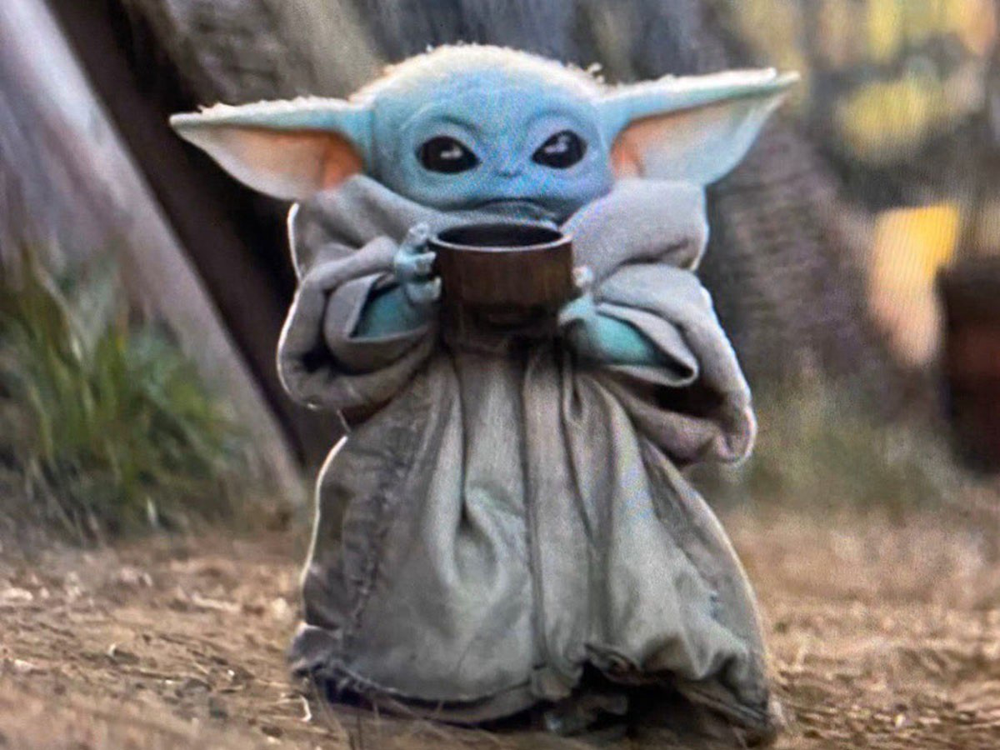

In [3]:
import numpy as np
from PIL import Image

img = Image.open('/content/test.jpeg')
img

# Download pre-traind model

In [4]:
# Uncomment if using local repo
# import sys
# sys.path.append('..')
from ISR.models import RDN, RRDN

# model = RDN(weights='noise-cancel')
model = RRDN(weights='gans')
# model = RDN(weights='psnr-small')
#model = RDN(weights='/content/psnr.hdf5')

17465344/17462488 [==============================] - 3s 0us/step


# image resize

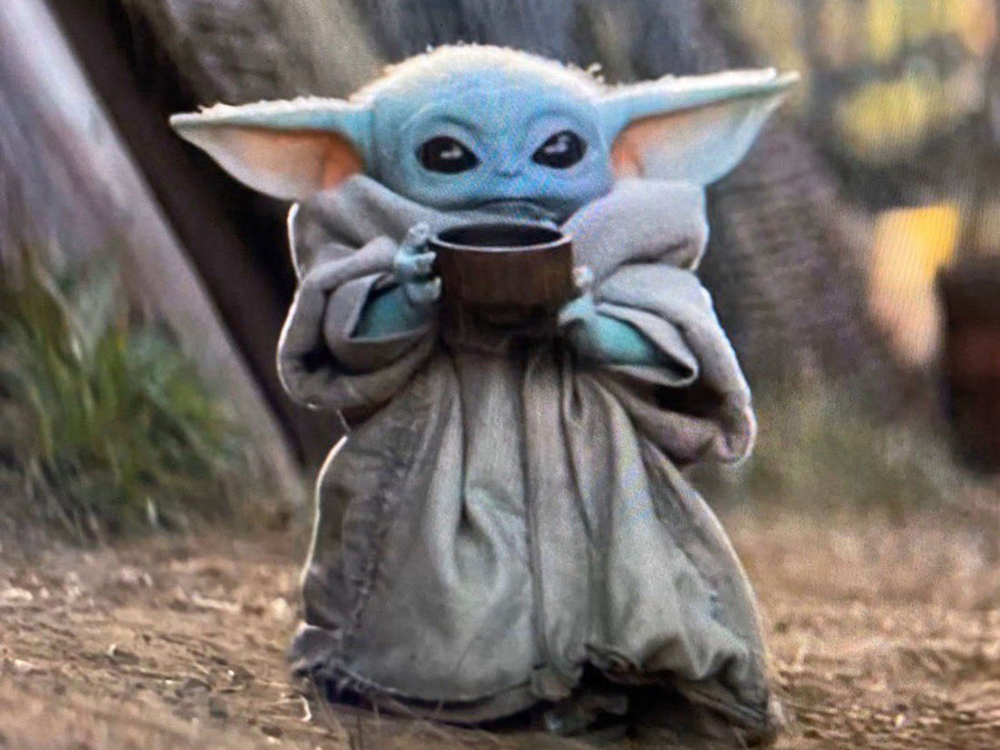

In [5]:
img.resize(size=(img.size[0]*4, img.size[1]*4), resample=Image.BICUBIC)

# Prediction

In [6]:
sr_img = model.predict(np.array(img))
Image.fromarray(sr_img)

# upscaling noisy images

Compress the image into the jpeg format to introduce compression artefact and lose some information.

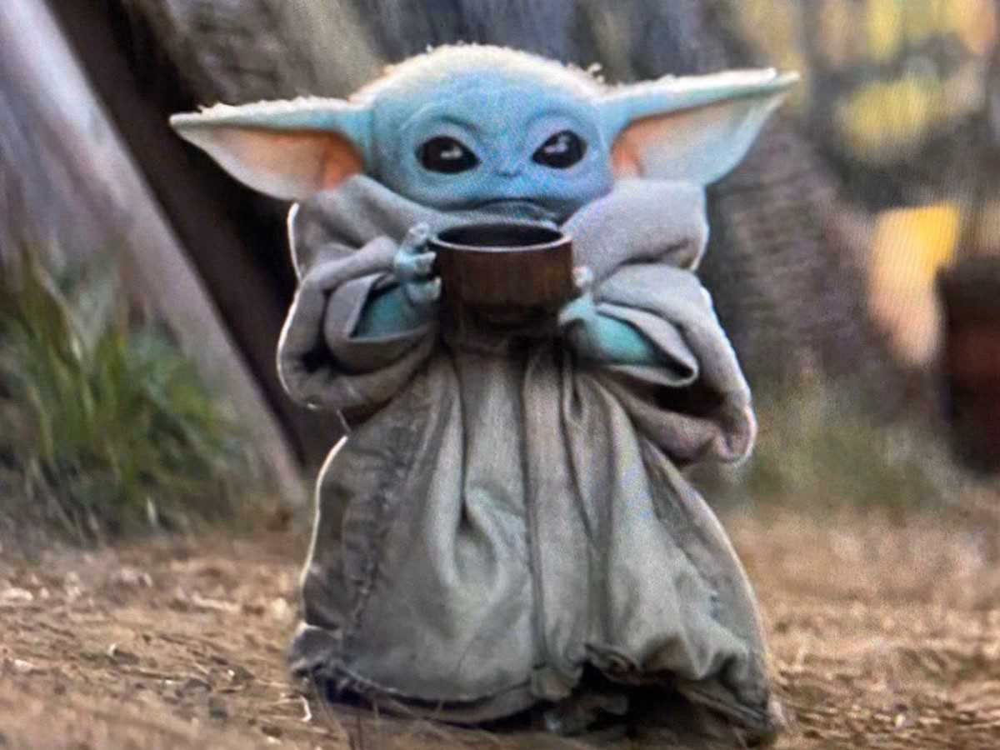

In [7]:
img.save('/content/2.jpg','JPEG', dpi=[300, 300], quality=50)
compressed_img = Image.open('/content/2.jpg')

compressed_img

# Baseline

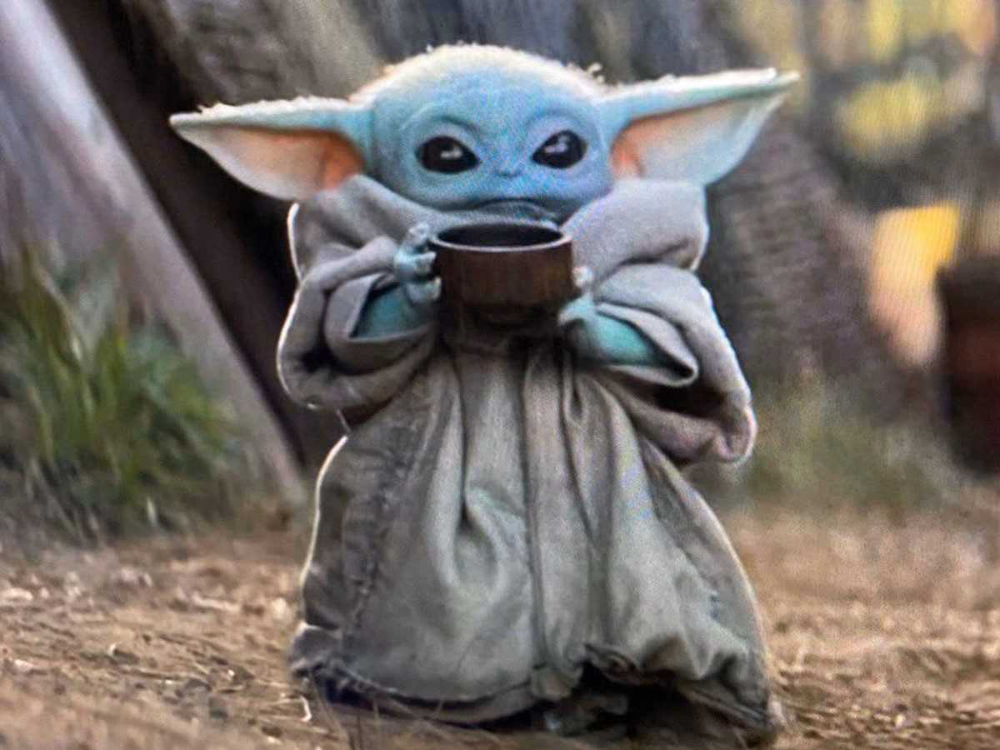

In [8]:
compressed_img.resize(size=(compressed_img.size[0]*2, compressed_img.size[1]*2), resample=Image.BICUBIC)

In [ ]:
model = RDN(weights='noise-cancel')
sr_img = model.predict(np.array(compressed_img))
Image.fromarray(sr_img)

66076672/66071288 [==============================] - 7s 0us/step
